In [5]:
import scanpy as sc
import pandas as pd
import numpy as np
import os,glob

In [4]:
data_folder = r'C:\Users\bbint\Downloads'
set_='_D13'
dff = pd.read_pickle(data_folder+r'\dff'+set_+'.npz_0p5thV6.pkl')
cell_df = pd.read_pickle(data_folder+r'\cell_df'+set_+'.npz_0p5thV6.pkl')

In [6]:
dff['blankmean']=dff[[gn for gn in dff.columns if 'blank' in gn]].mean(axis=1)
dff['blankperc']=np.percentile(dff[[gn for gn in dff.columns if 'blank' in gn]],99,axis=1)

In [ ]:
np.mean(dff['blankperc'])

In [7]:
gns_all = np.sort([gn for gn in dff.columns if 'blank' not in gn])
print(list(gns_all))
blanks = np.sort([gn for gn in dff.columns if 'blank' in gn])
print(list(blanks))

['1110008P14Rik', '1500015O10Rik', '1810041L15Rik', '2310069B03Rik', '2610528A11Rik', '2900055J20Rik', '3110035E14Rik', '4833407H14Rik', '4930570B17Rik', '6330403K07Rik', '9630013A20Rik', 'A1cf', 'A230050P20Rik', 'A830009L08Rik', 'A930003A15Rik', 'Abca8a', 'Abcb1b', 'Abcb4', 'Abcg1', 'Abhd15', 'Abhd2', 'Abi3', 'Abi3bp', 'Acer3', 'Ache', 'Acsl3', 'Acta2', 'Actg1', 'Adamts1', 'Adamts5', 'Adamts9', 'Adamtsl4', 'Adarb2', 'Adcy1', 'Adcy2', 'Adcyap1', 'Adgra2', 'Adgrd1', 'Adgre1', 'Adgrl3', 'Adh1', 'Adora2a', 'Adora3', 'Afap1l2', 'Afp', 'Agpat2', 'Agrp', 'Agt', 'Ahcyl2', 'Ahi1', 'Ahnak', 'Aif1', 'Aif1l', 'Akain1', 'Alas2', 'Alb', 'Aldh1a1', 'Aldh1a2', 'Aldh1a7', 'Aldh1l1', 'Aldoa', 'Aldoc', 'Alox12', 'Alox5ap', 'Alx1', 'Alyref', 'Ambra1', 'Amd2', 'Amot', 'Amz1', 'Angpt1', 'Ank2', 'Ankk1', 'Ankrd11', 'Anks6', 'Anln', 'Anp32e', 'Anxa2', 'Anxa5', 'Aoah', 'Ap3s1', 'Apln', 'Apoa1', 'Apoa2', 'Apoc2', 'Apod', 'Apoe', 'Apoo', 'Aqp1', 'Aqp2', 'Aqp3', 'Aqp4', 'Aqp8', 'Arg1', 'Arhgap10', 'Arhgap27', 'A

In [151]:
import matplotlib.pylab as plt
def plot_gene_scdata(scdata2,gene='SOX9',nmax=20,sz_min=5,sz_max=30,transpose=1,flipx=1,flipy=1,tag='X_spatial',recompute_raw=False):
    Xcells = np.array(scdata2.obsm[tag])[:,::transpose]*[flipx,flipy]
    ign = list(scdata2.var.index).index(gene)
    #scdata2.obsm['X_umap']
    if 'X_raw' not in scdata2.obsm or recompute_raw:
        Xnorm = (np.exp(scdata2.X)-1)
        ncts = np.sum(Xnorm,axis=1)[0]
        scdata2.obsm['X_raw']=np.round(Xnorm/ncts*np.array(scdata2.obs['total_counts'])[:,np.newaxis])
    cts = np.array(scdata2.obsm['X_raw'][gene]).copy()
    plt.style.use("dark_background")
    cts[np.isnan(cts)]=0
    #cts[cts>20]=0
    ncts = np.clip(cts/nmax,0,1)
    size = sz_min+ncts*(sz_max-sz_min)
    from matplotlib import cm as cmap
    cols = cmap.coolwarm(ncts)

    good_cells = slice(None)
    good_cells = np.argsort(cts)

    #blanks = [gn for gn in df.columns if 'blank' in gn]
    #blanks_cts = np.nanmean(df[blanks],axis=-1)
    #good_cells = blanks_cts<th_blank

    XC = -Xcells[good_cells,::-1]
    #viewer = napari.view_points(XC,size=size[good_cells],face_color=cols[good_cells],name=gene)
    fig = plt.figure(facecolor='k')
    plt.title(gene+' - N max '+str(nmax))
    fig.set_facecolor('black')
    img = plt.scatter(XC[:,0],XC[:,1],c=cols[good_cells],s=size[good_cells])
    plt.grid(False)
    plt.axis('equal')
    plt.xticks([])
    plt.yticks([])
    #plt.colorbar()
    #cbar = plt.colorbar(img,boundaries=[0, nmax], values=[0, 1],cmap='coolwarm')# boundaries=[0, nmax], values=[0, 1],cmap='coolwarm')
    #cbar.set_ticks([0, nmax])
    return fig

def plot_gene_mosaic_cells(df,cell_df,gene,plt_fov=False,transpose=1,flipx=1,flipy=1,sz_min=1,sz_max=30,nmax=20,viewer=None):
    cell_df_ = cell_df
    xcells,ycells=cell_df_['x_um_abs'],cell_df_['y_um_abs']
    Xcells = np.array([xcells*flipx,ycells*flipy][::transpose]).T
    vols = cell_df_['volm']
    
    cts = np.array(df[gene])#Ptbp1_smFISH
    cts[np.isnan(cts)]=0
    cts = cts/vols*np.median(vols)
    
    ncts = np.clip(cts/nmax,0,1)
    size = sz_min+ncts*(sz_max-sz_min)
    from matplotlib import cm as cmap
    cols = cmap.coolwarm(ncts)
    import napari
    good_cells = slice(None)
    good_cells = np.argsort(cts)
    names_cells = np.array(list(dff.index))[good_cells]
    XC = -Xcells[good_cells,::-1]
    if viewer is None:
        viewer = napari.view_points(XC,size=size[good_cells],face_color=cols[good_cells],name=gene)
    else:
        viewer.add_points(XC,size=size[good_cells],face_color=cols[good_cells],name=gene)
    if plt_fov:
        #ifovs = np.array(list(df.index),dtype=int)//10**5
        ifovs = [int(nm.split('_')[-2]) for nm in names_cells]
        ifov_unk = np.unique(ifovs)
        Xfov = np.array([np.mean(XC[ifovs==ifov],axis=0)for ifov in ifov_unk])
        features =  {'fov':ifov_unk}
        text = {
            'string': '{fov:.0f}',
            'size': 20,
            'color': 'gray',
            'translation': np.array([0, 0]),
        }
        viewer.add_points(Xfov,text=text,features=features,edge_width=0)
    return viewer


def plot_multigene_mosaic(df,cell_df,genes,cols,plt_fov=False,transpose=1,flipx=1,flipy=1,sz_min=1,sz_max=30,nmin=5,nmax=20,viewer=None):
    cell_df_ = cell_df
    xcells,ycells=cell_df_['x_um_abs'],cell_df_['y_um_abs']
    Xcells = np.array([xcells*flipx,ycells*flipy][::transpose]).T
    
    vols = cell_df_['volm']
    cts_all = []
    for gene in genes:
        cts = np.array(df[gene])
        cts[np.isnan(cts)]=0
        cts = cts/vols*np.median(vols)
        cts_all.append(cts)
    cts_all = np.array(cts_all)
    ncts = np.clip((cts_all-nmin)/(nmax-nmin),0,1)
    size = sz_min+ncts*(sz_max-sz_min)
    #from matplotlib import cm as cmap
    #cols = cmap.coolwarm(ncts)
    
    good_cells = slice(None)
    cts = np.sum(cts_all,axis=0)
    good_cells = np.argsort(cts)
    names_cells = np.array(list(dff.index))[good_cells]
    XC = -Xcells[good_cells,::-1]
    if viewer is None:
        import napari
        viewer = napari.Viewer()
    for ign in range(len(genes)):
        gene=genes[ign]
        size_=size[ign]
        viewer.add_points(XC,size=size_[good_cells],face_color=cols[ign%len(cols)],name=gene,edge_width=0,blending='Additive')
    if plt_fov:
        #ifovs = np.array(list(df.index),dtype=int)//10**5
        ifovs = [int(nm.split('_')[-2]) for nm in names_cells]
        ifov_unk = np.unique(ifovs)
        Xfov = np.array([np.mean(XC[ifovs==ifov],axis=0)for ifov in ifov_unk])
        features =  {'fov':ifov_unk}
        text = {
            'string': '{fov:.0f}',
            'size': 20,
            'color': 'gray',
            'translation': np.array([0, 0]),
        }
        viewer.add_points(Xfov,text=text,features=features,edge_width=0)
    return viewer

In [ ]:
plot_multigene_mosaic(dff,cell_df,['Slit1','Slit2','Slit3','Robo1'],['r','g','b','m'],
                      plt_fov=False,transpose=1,flipx=1,flipy=1,sz_min=0,sz_max=20,nmin=5,nmax=10,viewer=None);

In [71]:
plot_multigene_mosaic(dff,cell_df,['Csf1r','Itgam','Cx3cr1'],['r','g','b','m'],
                      plt_fov=False,transpose=1,flipx=1,flipy=1,sz_min=0,sz_max=20,nmin=5,nmax=10,viewer=None);

In [70]:
plot_multigene_mosaic(dff,cell_df,['Slit1','Slit2','Slit3','Robo1'],['r','g','b','m'],
                      plt_fov=False,transpose=1,flipx=1,flipy=1,sz_min=0,sz_max=20,nmin=5,nmax=10,viewer=None);

In [9]:
import napari

In [74]:
plot_gene_mosaic_cells(dff,cell_df,'Foxj1',plt_fov=False,transpose=1,flipx=1,flipy=1,sz_min=1,sz_max=10,nmax=20,viewer=None)

Viewer(axes=Axes(visible=False, labels=True, colored=True, dashed=False, arrows=True), camera=Camera(center=(0.0, -2346.5992279052734, -2726.2065620422363), zoom=0.10513329437983142, angles=(0.0, 0.0, 90.0), perspective=0.0, interactive=True), cursor=Cursor(position=(1.0, 1.0), scaled=True, size=1, style=<CursorStyle.STANDARD: 'standard'>), dims=Dims(ndim=2, ndisplay=2, last_used=0, range=((-4581.26416015625, -110.93429565429688, 1.0), (-5342.17138671875, -109.24173736572266, 1.0)), current_step=(2235, 2617), order=(0, 1), axis_labels=('0', '1')), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False), layers=[<Points layer 'Foxj1' at 0x26e45a8c4c0>], scale_bar=ScaleBar(visible=False, colored=False, color=array([1., 0., 1., 1.], dtype=float32), ticks=True, position=<Position.BOTTOM_RIGHT: 'bottom_right'>, font_size=10.0, box=False, box_color=array([0. , 0. , 0. , 0.6], dtype=float32), unit=None), text_overlay=TextOverlay(visible=False, color=array([0.5, 0.5, 0.5, 1. ], dtype=float32)

In [91]:
genes = np.sort([gn for gn in dff.columns if 'blank' not in gn])
genes_blank = np.sort([gn for gn in dff.columns if 'blank' in gn])

scdata = sc.AnnData(dff[genes],obs=cell_df[['volm','x_um_abs','y_um_abs','zc','xc','yc']])
scdata.obsm["blank"] = dff[genes_blank]
scdata.obsm["X_spatial"] = cell_df[['x_um_abs','y_um_abs']]
scdata.obsm["X_fov"] = cell_df[['zc','xc','yc']]
scdata.obsm["X_raw"] = dff[genes]

vols = np.array(scdata.obs["volm"])
scdata.X = scdata.X/vols[:,np.newaxis]*np.median(vols)
counts_per_cell = np.sum(scdata.X,axis=1)
scdata=scdata[counts_per_cell>100]
print(np.mean(counts_per_cell>100))

C:\Users\bbint\AppData\Local\Temp/ipykernel_25840/265480830.py:4: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  scdata = sc.AnnData(dff[genes],obs=cell_df[['volm','x_um_abs','y_um_abs','zc','xc','yc']])
C:\Users\bbint\AppData\Local\Temp/ipykernel_25840/265480830.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  scdata = sc.AnnData(dff[genes],obs=cell_df[['volm','x_um_abs','y_um_abs','zc','xc','yc']])


0.9644942361107532


In [92]:
sc.pp.calculate_qc_metrics(scdata, percent_top=None, inplace=True)
sc.pp.normalize_total(scdata, target_sum=np.median(scdata.obs["total_counts"]))
sc.pp.log1p(scdata)
### potentially trim
sc.pp.pca(scdata,n_comps=100)
sc.pp.neighbors(scdata)#,use_rep = "X")
sc.tl.leiden(scdata, resolution=5)
sc.tl.umap(scdata,random_state=9)

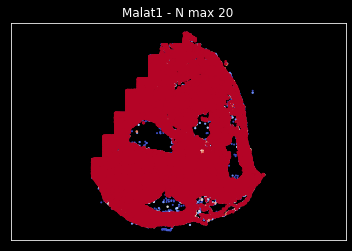

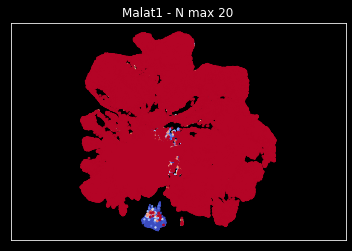

In [93]:
gene = 'Malat1'
fig = plot_gene_scdata(scdata,gene=gene,nmax=20,sz_min=1,sz_max=3,transpose=1,flipx=1,flipy=1,
                       tag='X_spatial',recompute_raw=False)#X_umap,X_spatial

fig = plot_gene_scdata(scdata,gene=gene,nmax=20,sz_min=1,sz_max=3,transpose=1,flipx=1,flipy=1,
                       tag='X_umap',recompute_raw=False)#X_umap,X_spatial

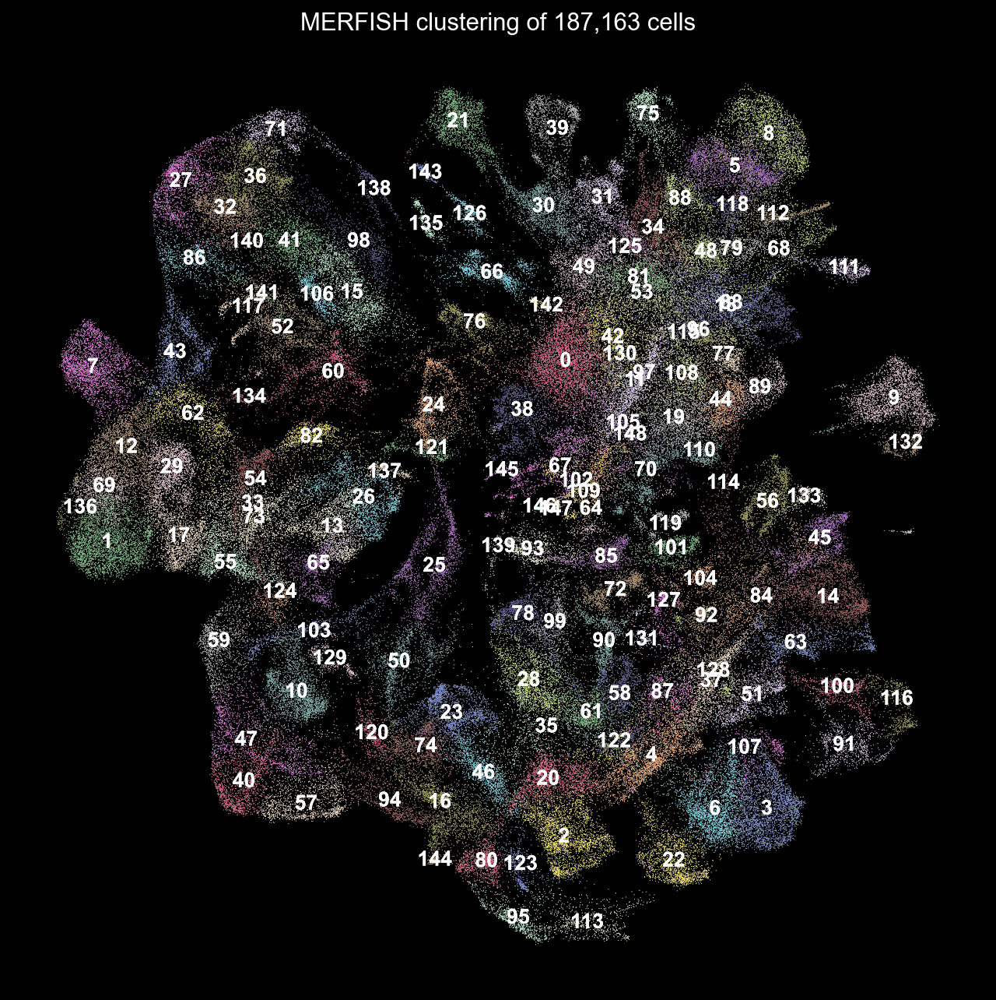

In [95]:
cmap = ["#e6194B", "#3cb44b", "#ffe119", "#4363d8", "#f58231", "#911eb4", "#42d4f4", "#f032e6", "#bfef45",
        "#fabed4", "#469990", "#dcbeff", "#9A6324", "#fffac8", "#800000", "#aaffc3", "#808000", "#ffd8b1",
        "#000075", "#a9a9a9"]

sc.set_figure_params(figsize=(10,10))
sc.pl.umap(
    scdata,
    color="leiden",
    add_outline=True,
    legend_loc="on data",
    legend_fontsize=12,
    legend_fontoutline=0,
    frameon=False,
    title=f"MERFISH clustering of {len(scdata):,d} cells",
    palette=cmap
)

In [139]:

def get_top_genes(scdata,ntop=10):
    cell_type = scdata.obs['leiden']
    cell_typeu,leiden = np.unique(cell_type,return_inverse=True)
    genesf = np.array(scdata.var.index)
    X = np.array(scdata.X)
    leidenu = np.unique(leiden)
    means = np.array([np.mean(X[leiden==u],axis=0) for u in leidenu])
    mean= np.mean(means,axis=0)
    dif = means-mean
    top_genes = genesf[np.argsort(dif,axis=-1)[::-1]][:,:ntop]
    best_leiden = np.argsort(means,axis=0)[-1,:]
    second_best_leiden = np.argsort(means,axis=0)[-2,:]
    top_gene_dic = {}
    for il in leidenu:
        keep = best_leiden==il
        dif__ = means[best_leiden,np.arange(len(best_leiden))]-means[second_best_leiden,np.arange(len(best_leiden))]
        gene_1 = genesf[keep][np.argsort(dif__[keep])[::-1]][:ntop]
        #print(gene_1)
        dif__ = means[best_leiden,np.arange(len(best_leiden))]-mean
        gene_2 = genesf[keep][np.argsort(dif__[keep])[::-1]][:ntop]
        #print(gene_2)
        top_gene_dic[cell_typeu[il]]=[top_genes[il],gene_1,gene_2]
    #top_gene_dic
    genes_sel = np.unique([gn for icl in top_gene_dic for gns in top_gene_dic[icl] for gn in gns])
    len(genes_sel)
    return top_gene_dic,genes_sel

In [178]:
top_gene_dic,genes_sel = get_top_genes(scdata,ntop=1)

In [147]:
top_gene_dic,genes_sel_ = get_top_genes(scdata,ntop=5)

In [182]:
scdata_sub = scdata[:,genes_sel]

In [205]:
keep = scdata.obsm['X_raw']['Csf1r']>=10
print(np.sum(keep))
signal = np.mean(scdata[keep].X,axis=0)
dif_ = signal-np.mean(scdata.X,axis=0)
cell_type = scdata.obs['leiden']
cell_typeu,leiden = np.unique(cell_type,return_inverse=True)
genesf = np.array(scdata.var.index)
X = np.array(scdata.X)
leidenu = np.unique(leiden)
means = np.array([np.mean(X[leiden==u],axis=0) for u in leidenu])
mean= np.mean(means,axis=0)

from scipy.spatial.distance import cdist
ibest = np.argmin(cdist(means,signal[np.newaxis],metric='correlation'))

dif_ = signal-mean#means[ibest]
genesf = np.array(scdata.var.index)
genesf[np.argsort(dif_)[::-1]][:20]


933


array(['Apoe', 'Csf1r', 'Laptm5', 'Lgmn', 'H19', 'Sparc', 'Col1a1',
       'Deptor', 'Igfbp4', 'Tgfbr2', 'Cd163', 'Col3a1', 'Mrc1', 'Apoc2',
       'C1qb', 'Maf', 'Kctd12', 'Serpinh1', 'Psap', 'Lamp1'], dtype=object)

In [209]:
'Sparc' in genes_sel

True

In [193]:
signal = np.mean(scdata[keep].X,axis=0)

In [190]:
'Irf8' in genes_sel

False

In [ ]:
gene_sel__ = np.unique(list(genes_sel)+['Lgmn','Irf8','Csf1r','Apoe','Cd163','Mrc1','Laptm5'])
scdata_sub = scdata[:,gene_sel__]
sc.pp.pca(scdata_sub,n_comps=100)
sc.pp.neighbors(scdata_sub)#,use_rep = "X")
sc.tl.leiden(scdata_sub, resolution=5)
sc.tl.umap(scdata_sub,random_state=9)


In [ ]:
plot_cluster_scdata(scdata,cmap,clusters=np.arange(50))

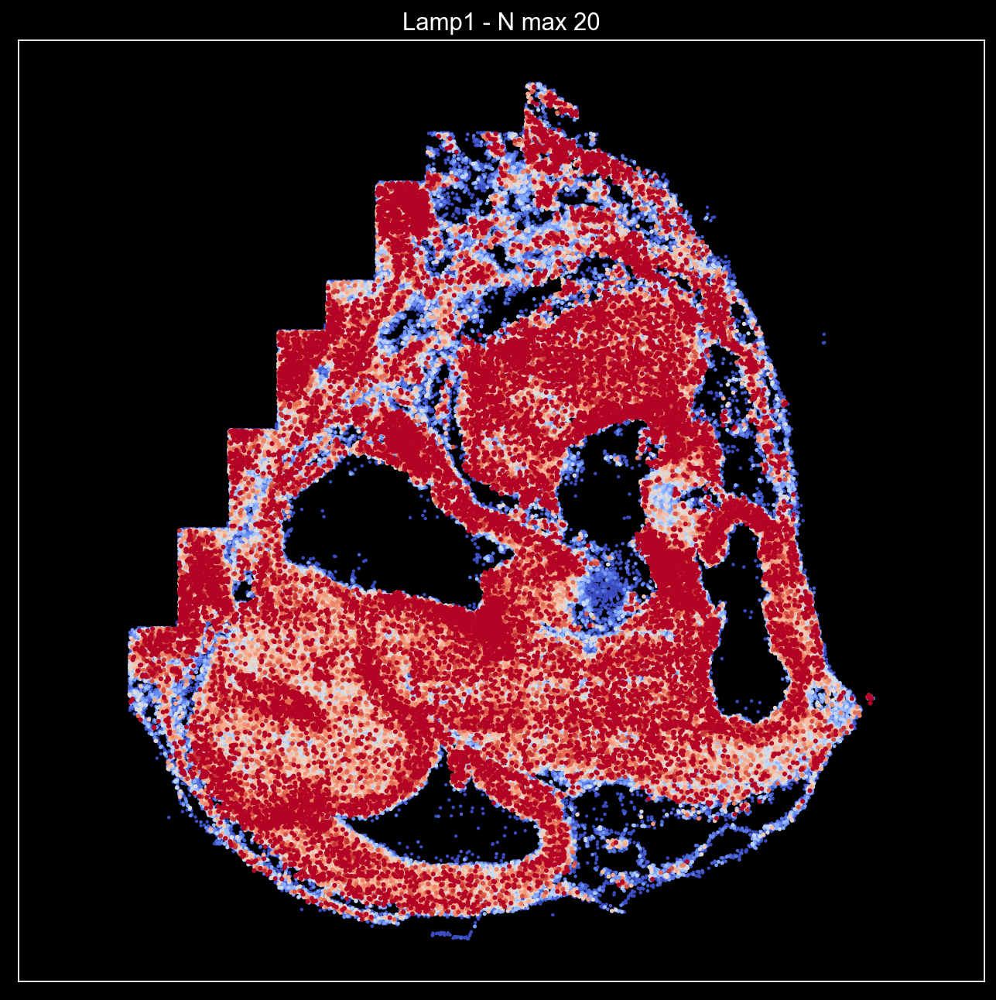

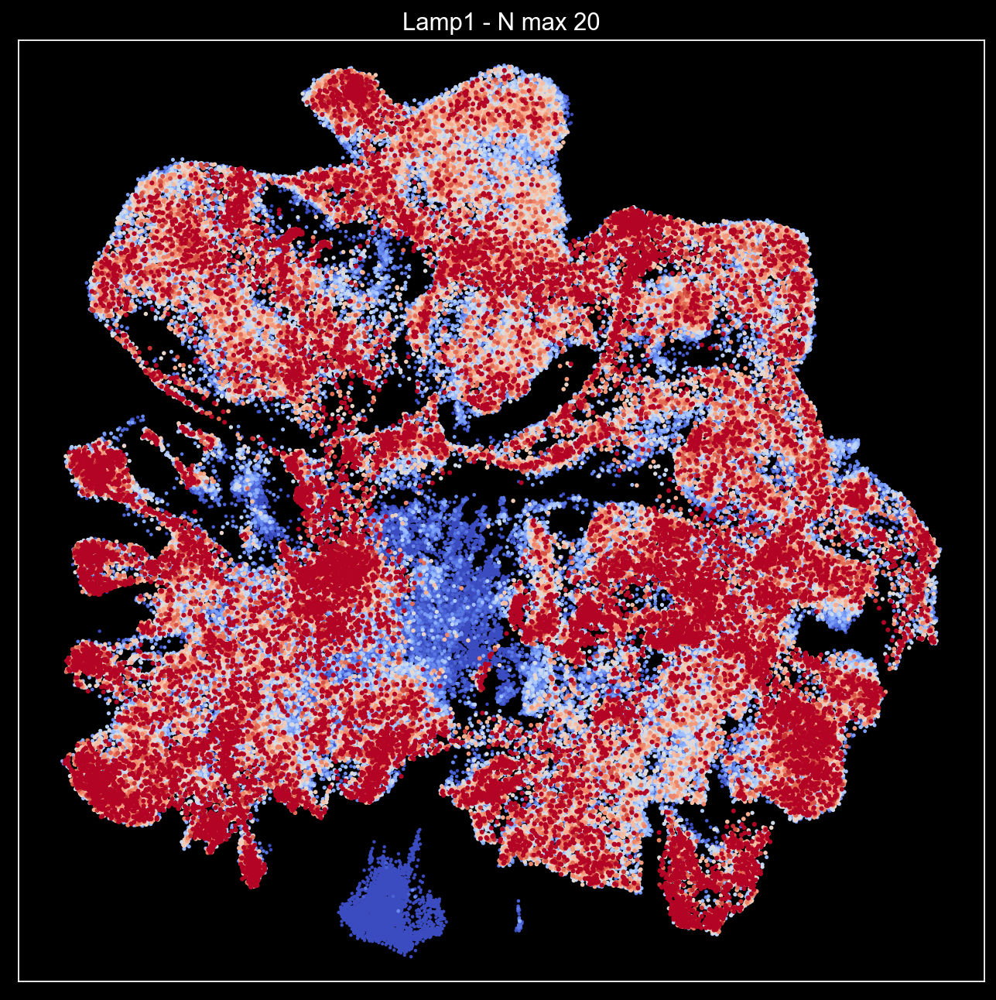

In [221]:
gene = 'Lamp1'
Nmax=20
fig = plot_gene_scdata(scdata,gene=gene,nmax=Nmax,sz_min=1,sz_max=3,transpose=1,flipx=1,flipy=1,
                       tag='X_spatial',recompute_raw=False)#X_umap,X_spatial

fig = plot_gene_scdata(scdata,gene=gene,nmax=Nmax,sz_min=1,sz_max=3,transpose=1,flipx=1,flipy=1,
                       tag='X_umap',recompute_raw=False)#X_umap,X_spatial

In [96]:
from ioMicro import *

In [103]:
def plot_cluster_scdata(scdata,cmap,clusters=[1,2],transpose=1,flipx=1,flipy=1):
    import matplotlib.pyplot as plt
    plt.figure(figsize=(15, 15), facecolor="black")

    from matplotlib import pylab as plt
    x,y = (np.array(scdata.obsm['X_spatial'])*[flipx,flipy])[:,::transpose].T
    #np.unique(scdata.obs["leiden"].astype(np.int))[::-1]
    plt.scatter(x, y, c='gray', s=5, marker='.')
    for cluster in clusters:
        cluster_ = str(cluster)
        inds = scdata.obs["leiden"] == cluster_
        x_ = x[inds]
        y_ = y[inds]
        col = cmap[int(cluster) % len(cmap)]
        plt.scatter(x_, y_, c=col, s=30, marker='.',label = cluster_)
    
    plt.grid(b=False)
    plt.axis("off")
    plt.axis("equal")
    plt.legend()
    plt.tight_layout()


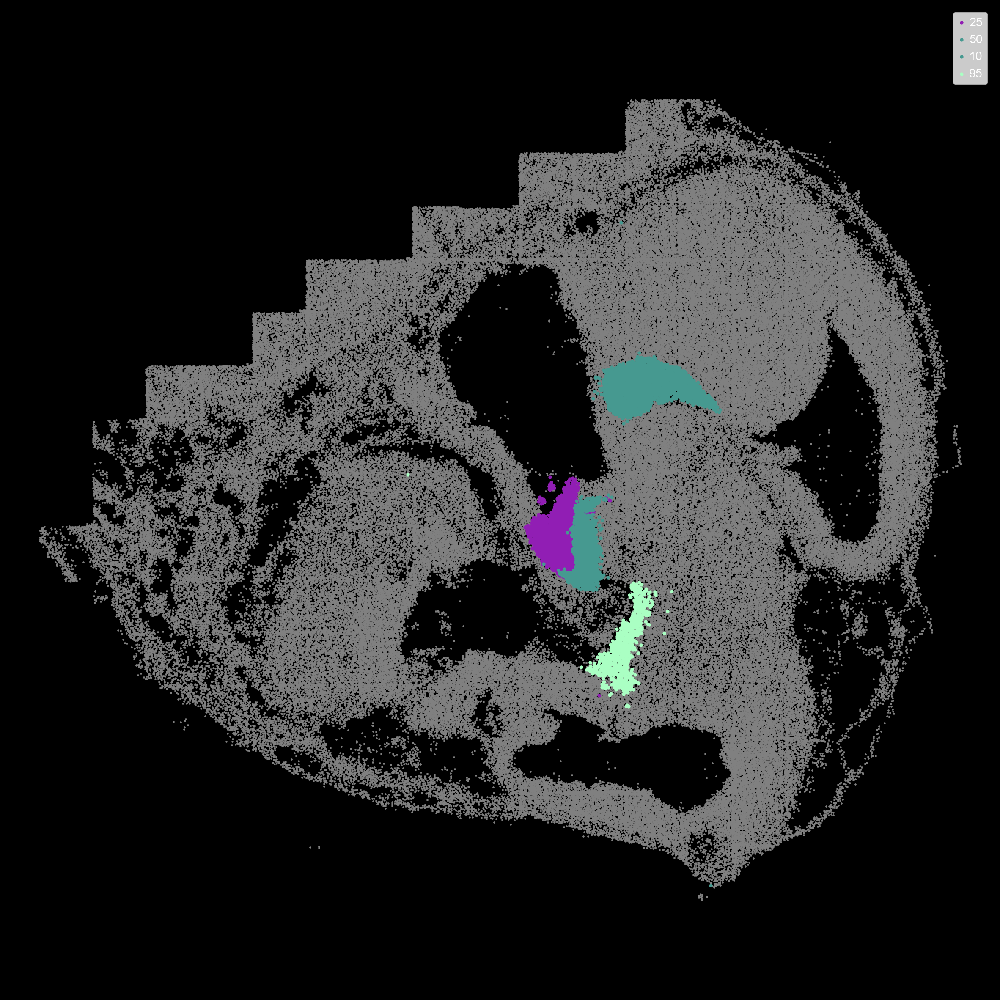

In [137]:
plot_cluster_scdata(scdata,cmap,clusters=[25,50,10,95])

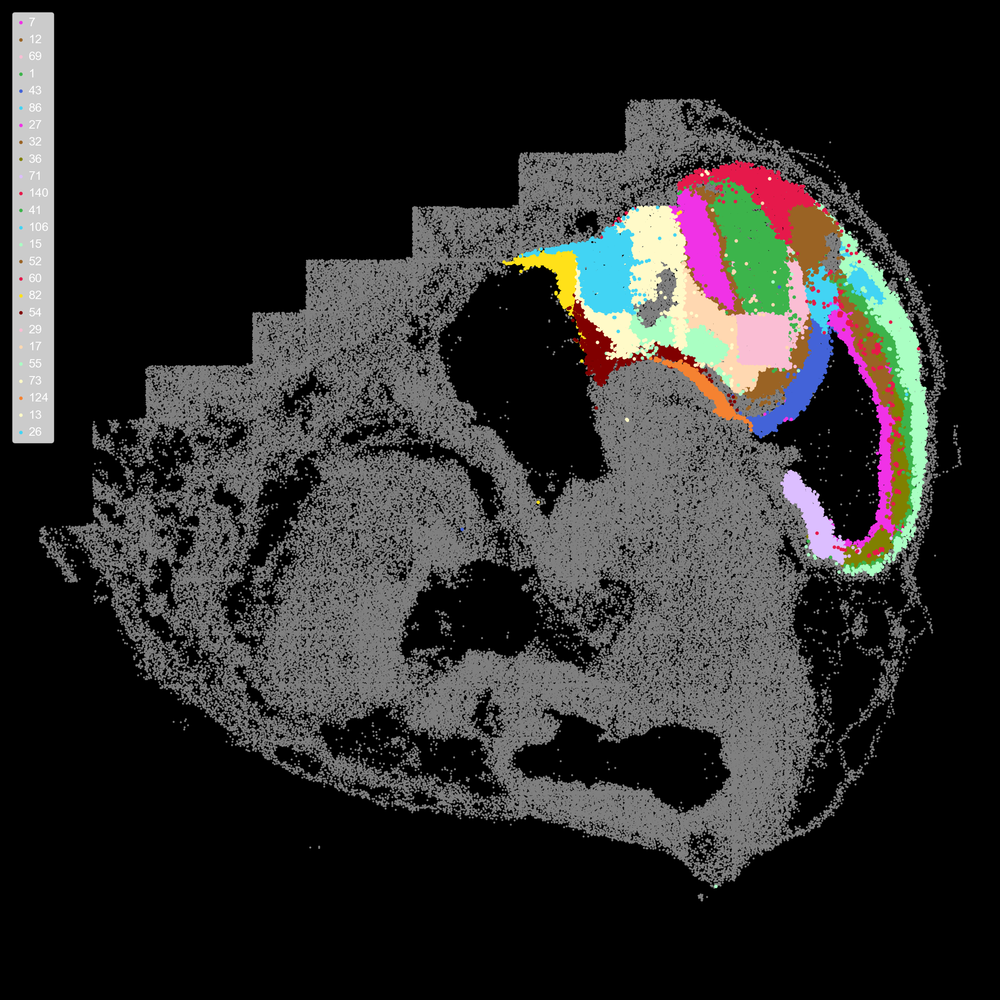

In [134]:
plot_cluster_scdata(scdata,cmap,clusters=[7,12,69,1,43,86,
                                          27,32,36,71,140,41,106,15,52,60,82,54,
                                         29,17,55,73,124,13,26])